# Noise + Deformation Field Demo

End-to-end demonstration of the volumetric augmentation pipeline:
1. Load a grayscale test image and expand it into a 3D volume
2. Apply a deformation field to warp the volume
3. Add noise to the warped volume
4. Visualize the original, deformed, noisy, and combined results

Both the input image and the deformation field are configurable at the top.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib widget

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.data

import py_deffields as pd
from py_deffields.fields import (
    generate_star,
    generate_curve,
    generate_sphere,
    generate_overall,
    generate_static,
)
from py_deffields.noise import (
    generate_gaussian,
    generate_perlin,
    generate_blobs,
    generate_poisson,
    generate_cellular,
    generate_spectral,
    normalize_noise,
    add_noise,
)

## Settings

### Image

Available grayscale images from `skimage.data`:
`camera`, `moon`, `coins`, `brick`, `grass`, `gravel`, `cell`, `clock`, `page`, `text`, `checkerboard`

### Deformation Field

Set `DEFORMATION` to one of the following strings:

| Value | Description |
|-------|-------------|
| `"star"` | Sinusoidal wave pattern with spatially varying periods |
| `"curve"` | Power-law gradient along each axis with rotation |
| `"sphere"` | Spherical tangential flow / vortex pattern |
| `"overall"` | Composite: sphere + star + polynomial modulation |
| `"static"` | Uniform translation (baseline) |
| `"elastic"` | Gaussian-smoothed random displacement |
| `"bspline"` | B-spline free-form deformation |
| `"affine"` | Random affine transformation |

In [3]:
# --- User settings ---
IMAGE_NAME = "camera"       # skimage.data grayscale image name
DEPTH = 64                  # Number of z-slices
DISPLAY_SLICE = 32          # Which z-slice to display
SEED = 42                   # Global random seed

DEFORMATION = "star"        # Deformation field type (see table above)
MAX_DISPLACEMENT = 8.0      # Max displacement for analytic fields (voxels)
# ---------------------

rng_master = np.random.default_rng(SEED)

## Volume Setup

In [4]:
image_2d = getattr(skimage.data, IMAGE_NAME)()
if image_2d.ndim == 3:
    image_2d = np.mean(image_2d, axis=-1)
image_2d = image_2d.astype(np.float64)
image_2d = (image_2d - image_2d.min()) / (image_2d.max() - image_2d.min())

volume = np.stack([image_2d] * DEPTH, axis=0)
shape = volume.shape

print(f"Image: {IMAGE_NAME}")
print(f"Volume shape: {shape} (D, H, W)")
print(f"Display slice: z={DISPLAY_SLICE}")

Image: camera
Volume shape: (64, 512, 512) (D, H, W)
Display slice: z=32


## Deformation Field Generation

In [5]:
rng_def = np.random.default_rng(rng_master.integers(0, 2**32))

deformation_generators = {
    # Analytic / functional fields
    "star": lambda: generate_star(shape, max_displacement=MAX_DISPLACEMENT, rng=rng_def),
    "curve": lambda: generate_curve(shape, max_displacement=MAX_DISPLACEMENT, rng=rng_def),
    "sphere": lambda: generate_sphere(shape, max_displacement=MAX_DISPLACEMENT, rng=rng_def),
    "overall": lambda: generate_overall(shape, max_displacement=MAX_DISPLACEMENT, rng=rng_def),
    "static": lambda: generate_static(shape, max_displacement=MAX_DISPLACEMENT, rng=rng_def),
    # Class-based fields
    "elastic": lambda: pd.ElasticDeformation(alpha=MAX_DISPLACEMENT, sigma=5.0).generate(shape, rng=rng_def),
    "bspline": lambda: pd.BSplineDeformation(control_point_spacing=16, displacement_sigma=MAX_DISPLACEMENT / 4).generate(shape, rng=rng_def),
    "affine": lambda: pd.AffineDeformation(rotation_range=(-0.05, 0.05), scale_range=(0.95, 1.05), translation_range=(-MAX_DISPLACEMENT, MAX_DISPLACEMENT)).generate(shape, rng=rng_def),
}

if DEFORMATION not in deformation_generators:
    raise ValueError(f"Unknown deformation type: {DEFORMATION!r}. Choose from: {list(deformation_generators.keys())}")

displacement = deformation_generators[DEFORMATION]()

print(f"Deformation: {DEFORMATION}")
print(f"Displacement field shape: {displacement.shape}")
print(f"Displacement range per axis:")
for i, axis in enumerate("DHW"):
    dmin, dmax = displacement[..., i].min(), displacement[..., i].max()
    print(f"  {axis}: [{dmin:+.2f}, {dmax:+.2f}] voxels")

Deformation: star
Displacement field shape: (64, 512, 512, 3)
Displacement range per axis:
  D: [-7.43, +7.43] voxels
  H: [-7.44, +7.44] voxels
  W: [-7.34, +7.34] voxels


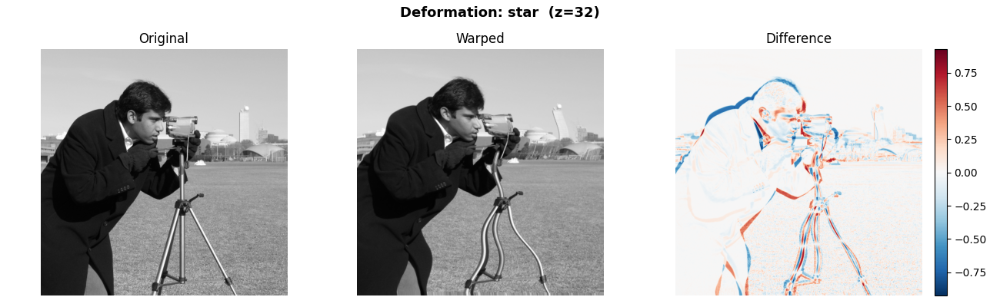

In [6]:
warped_volume = pd.warp(volume, displacement, order=1, mode="nearest")

# Visualise original vs warped
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
fig.suptitle(f"Deformation: {DEFORMATION}  (z={DISPLAY_SLICE})", fontsize=13, fontweight="bold")

axes[0].imshow(volume[DISPLAY_SLICE], cmap="gray", vmin=0, vmax=1)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(warped_volume[DISPLAY_SLICE], cmap="gray", vmin=0, vmax=1)
axes[1].set_title("Warped")
axes[1].axis("off")

diff = warped_volume[DISPLAY_SLICE] - volume[DISPLAY_SLICE]
vlim = max(abs(diff.min()), abs(diff.max())) or 1.0
im = axes[2].imshow(diff, cmap="RdBu_r", vmin=-vlim, vmax=vlim)
axes[2].set_title("Difference")
axes[2].axis("off")
fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

fig.tight_layout()
plt.show()

### Displacement field visualisation

Displacement magnitude and per-axis component maps at the display slice.

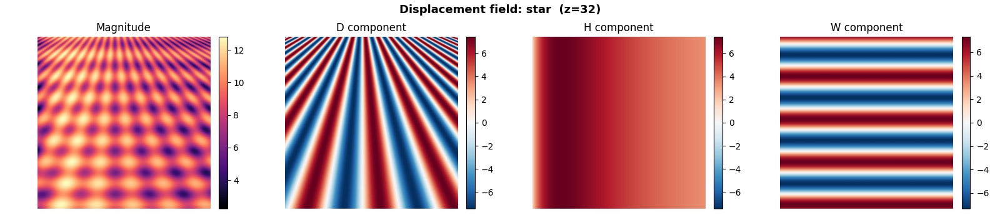

In [7]:
disp_slice = displacement[DISPLAY_SLICE]
magnitude = np.linalg.norm(disp_slice, axis=-1)

fig, axes = plt.subplots(1, 4, figsize=(16, 3.5))
fig.suptitle(f"Displacement field: {DEFORMATION}  (z={DISPLAY_SLICE})", fontsize=13, fontweight="bold")

im0 = axes[0].imshow(magnitude, cmap="magma")
axes[0].set_title("Magnitude")
axes[0].axis("off")
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

for i, (ax, label) in enumerate(zip(axes[1:], ["D component", "H component", "W component"])):
    comp = disp_slice[..., i]
    vlim = max(abs(comp.min()), abs(comp.max())) or 1.0
    im = ax.imshow(comp, cmap="RdBu_r", vmin=-vlim, vmax=vlim)
    ax.set_title(label)
    ax.axis("off")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

fig.tight_layout()
plt.show()

---
## Noise on Warped Volume

Each section below applies a different noise type to the **warped** volume.
The display helper shows: noise pattern | warped + noise | difference from warped.

In [8]:
def show_augmented(
    noise_fields: dict[str, np.ndarray],
    base: np.ndarray,
    z: int,
    weight: float = 0.3,
    suptitle: str = "",
) -> None:
    """Display noise, augmented image, and difference for each variant."""
    n = len(noise_fields)
    fig, axes = plt.subplots(3, n, figsize=(4 * n, 10.5), squeeze=False)
    fig.suptitle(suptitle, fontsize=14, fontweight="bold", y=1.0)

    for col, (label, noise) in enumerate(noise_fields.items()):
        noise_slice = noise[z]
        base_slice = base[z]

        # Normalise noise to [0, 1] for display
        nmin, nmax = noise_slice.min(), noise_slice.max()
        if nmax - nmin > 1e-10:
            noise_disp = (noise_slice - nmin) / (nmax - nmin)
        else:
            noise_disp = np.zeros_like(noise_slice)

        augmented = np.clip(base_slice + weight * (noise_disp - 0.5), 0, 1)

        # Row 0: noise pattern
        axes[0, col].imshow(noise_disp, cmap="gray", vmin=0, vmax=1)
        axes[0, col].set_title(label, fontsize=10)
        axes[0, col].axis("off")

        # Row 1: warped + noise
        axes[1, col].imshow(augmented, cmap="gray", vmin=0, vmax=1)
        axes[1, col].set_title(f"overlay (w={weight})", fontsize=9)
        axes[1, col].axis("off")

        # Row 2: difference
        diff = augmented - base_slice
        vlim = max(abs(diff.min()), abs(diff.max())) or 1.0
        axes[2, col].imshow(diff, cmap="RdBu_r", vmin=-vlim, vmax=vlim)
        axes[2, col].set_title("difference", fontsize=9)
        axes[2, col].axis("off")

    axes[0, 0].set_ylabel("noise", fontsize=10)
    axes[1, 0].set_ylabel("warped + noise", fontsize=10)
    axes[2, 0].set_ylabel("difference", fontsize=10)
    fig.tight_layout()
    plt.show()

---
### Gaussian Noise

Independent i.i.d. noise at each voxel, varying standard deviation.

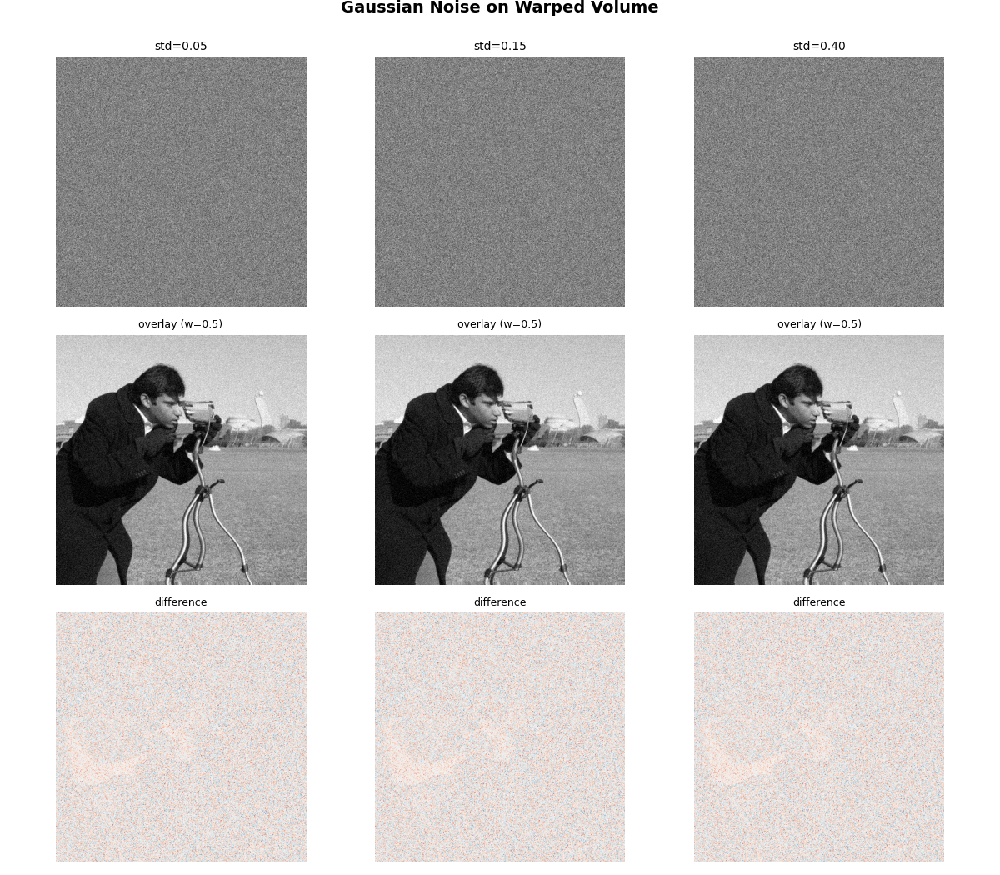

In [9]:
gaussian_variants = {
    "std=0.05": generate_gaussian(shape, std=0.05, rng=np.random.default_rng(SEED)),
    "std=0.15": generate_gaussian(shape, std=0.15, rng=np.random.default_rng(SEED)),
    "std=0.40": generate_gaussian(shape, std=0.40, rng=np.random.default_rng(SEED)),
}

show_augmented(gaussian_variants, warped_volume, DISPLAY_SLICE, weight=0.5, suptitle="Gaussian Noise on Warped Volume")

---
### Perlin Noise

Coherent gradient noise with scale and octave variations.

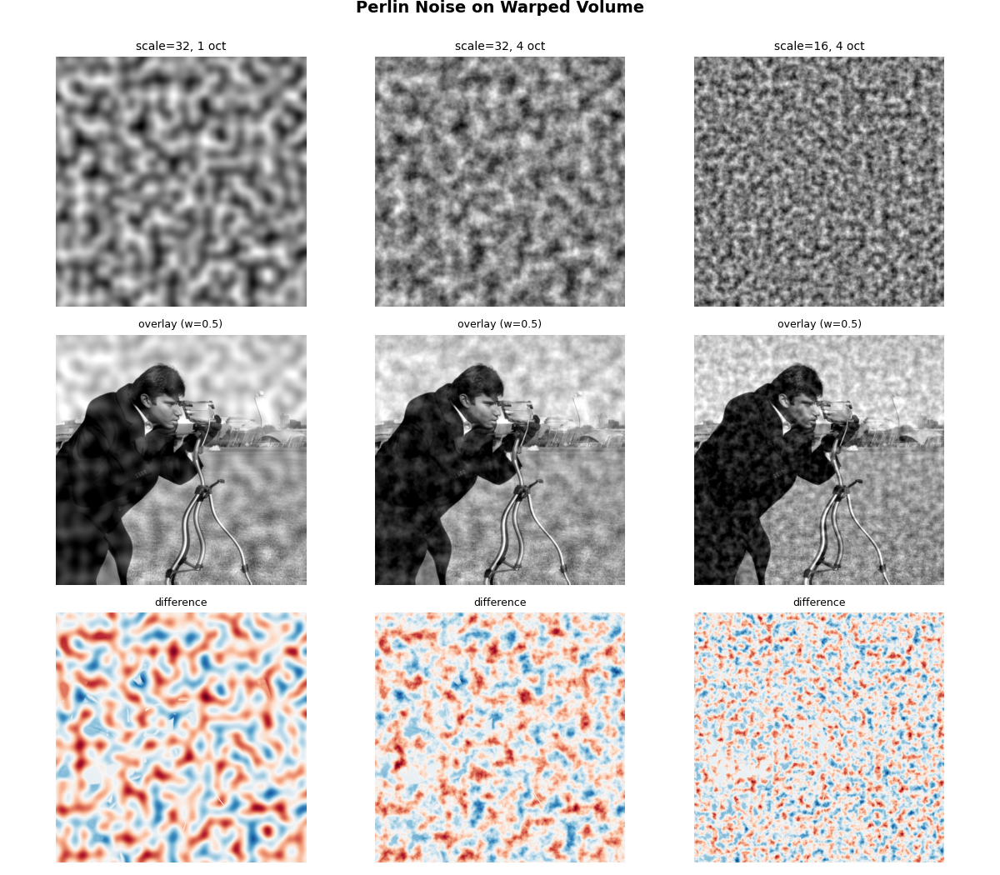

In [10]:
perlin_variants = {
    "scale=32, 1 oct": generate_perlin(shape, scale=32.0, octaves=1, rng=np.random.default_rng(SEED)),
    "scale=32, 4 oct": generate_perlin(shape, scale=32.0, octaves=4, rng=np.random.default_rng(SEED)),
    "scale=16, 4 oct": generate_perlin(shape, scale=16.0, octaves=4, rng=np.random.default_rng(SEED)),
}

show_augmented(perlin_variants, warped_volume, DISPLAY_SLICE, weight=0.5, suptitle="Perlin Noise on Warped Volume")

---
### Blob Noise

Randomly placed spherical features: soft vs hard edges, varying count.

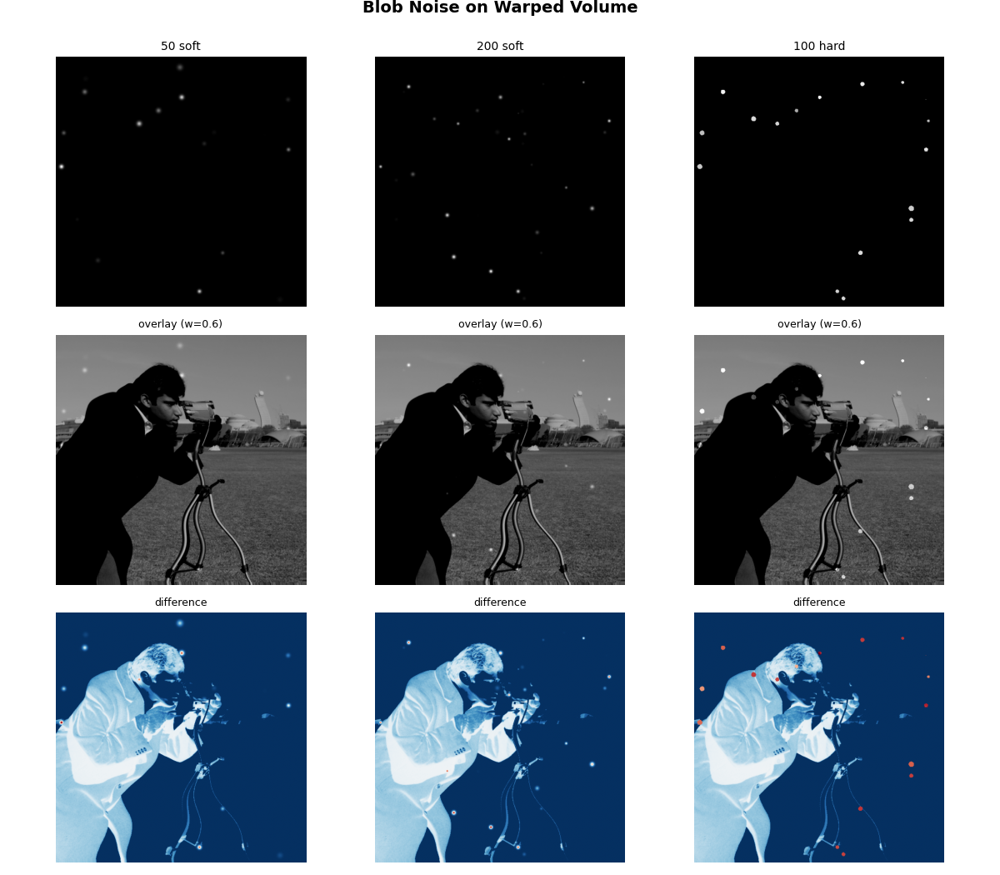

In [11]:
blob_variants = {
    "50 soft": generate_blobs(shape, num_blobs=50, radius_mean=6.0, soft=True, rng=np.random.default_rng(SEED)),
    "200 soft": generate_blobs(shape, num_blobs=200, radius_mean=4.0, soft=True, rng=np.random.default_rng(SEED)),
    "100 hard": generate_blobs(shape, num_blobs=100, radius_mean=5.0, soft=False, rng=np.random.default_rng(SEED)),
}

show_augmented(blob_variants, warped_volume, DISPLAY_SLICE, weight=0.6, suptitle="Blob Noise on Warped Volume")

---
### Poisson (Shot) Noise

Signal-dependent noise applied to the warped volume directly.
Lower `scale` means fewer photons and heavier noise.

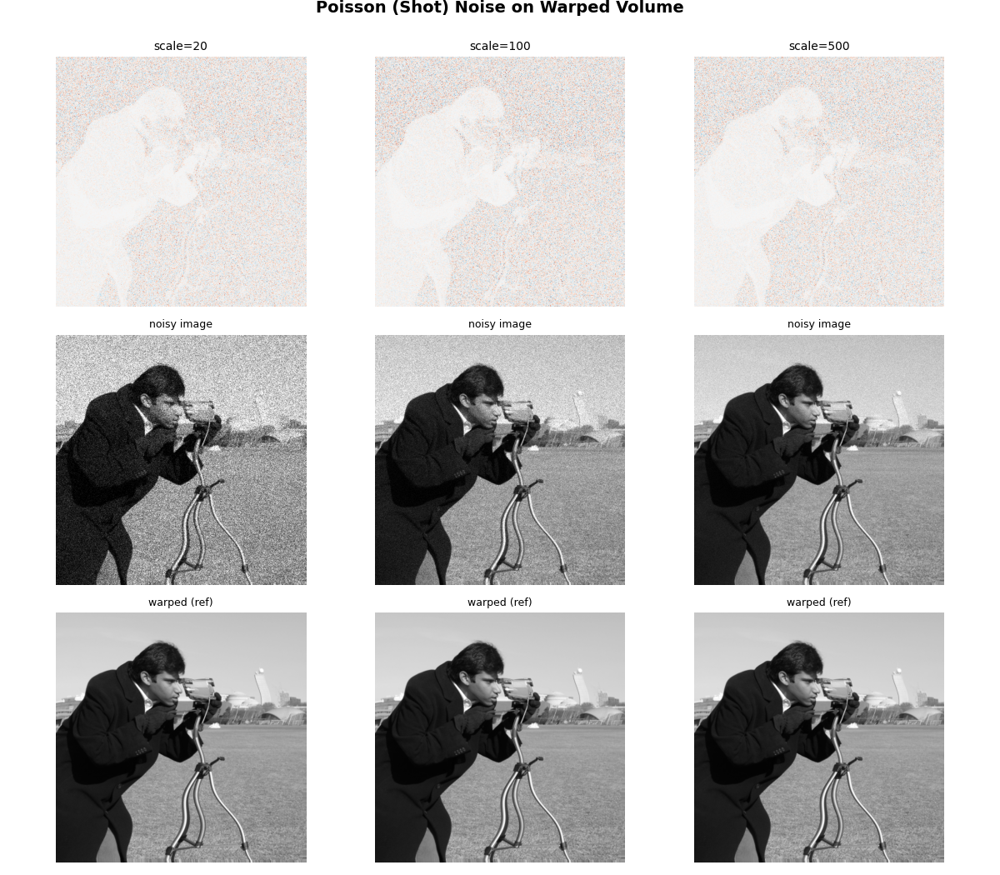

In [12]:
poisson_scales = {"scale=20": 20.0, "scale=100": 100.0, "scale=500": 500.0}

n = len(poisson_scales)
fig, axes = plt.subplots(3, n, figsize=(4 * n, 10.5), squeeze=False)
fig.suptitle("Poisson (Shot) Noise on Warped Volume", fontsize=14, fontweight="bold", y=1.0)

for col, (label, sc) in enumerate(poisson_scales.items()):
    noisy = generate_poisson(
        shape, signal=warped_volume, scale=sc, normalize=False,
        rng=np.random.default_rng(SEED),
    )
    noisy_slice = noisy[DISPLAY_SLICE]
    base_slice = warped_volume[DISPLAY_SLICE]
    diff = noisy_slice - base_slice

    # Row 0: noise delta (diverging colormap)
    vlim = max(abs(diff.min()), abs(diff.max())) or 1.0
    axes[0, col].imshow(diff, cmap="RdBu_r", vmin=-vlim, vmax=vlim)
    axes[0, col].set_title(label, fontsize=10)
    axes[0, col].axis("off")

    # Row 1: full noisy image
    axes[1, col].imshow(np.clip(noisy_slice, 0, 1), cmap="gray", vmin=0, vmax=1)
    axes[1, col].set_title("noisy image", fontsize=9)
    axes[1, col].axis("off")

    # Row 2: original warped for reference
    axes[2, col].imshow(base_slice, cmap="gray", vmin=0, vmax=1)
    axes[2, col].set_title("warped (ref)", fontsize=9)
    axes[2, col].axis("off")

axes[0, 0].set_ylabel("noise delta", fontsize=10)
axes[1, 0].set_ylabel("noisy image", fontsize=10)
axes[2, 0].set_ylabel("warped (ref)", fontsize=10)
fig.tight_layout()
plt.show()

---
### Cellular (Worley) Noise

Cell-like tessellation patterns: Euclidean vs Manhattan, F1 vs F2-F1.

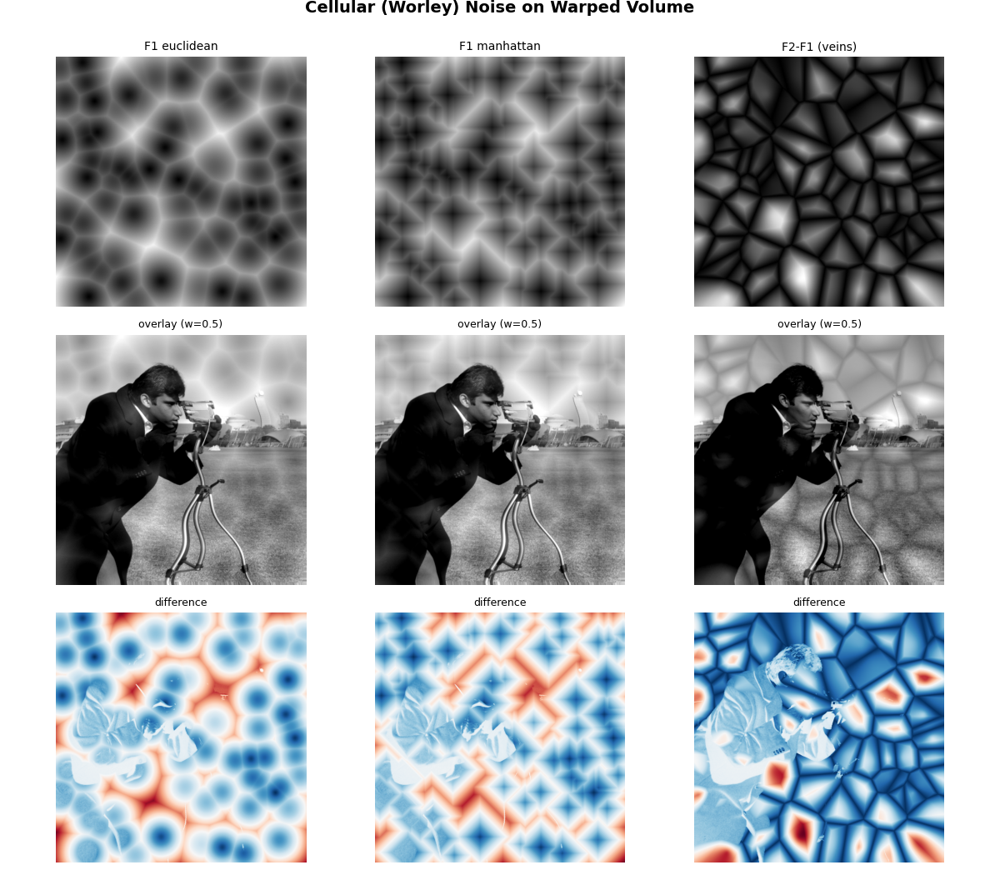

In [13]:
cellular_variants = {
    "F1 euclidean": generate_cellular(shape, num_points=80, metric="euclidean", combination="F1", rng=np.random.default_rng(SEED)),
    "F1 manhattan": generate_cellular(shape, num_points=80, metric="manhattan", combination="F1", rng=np.random.default_rng(SEED)),
    "F2-F1 (veins)": generate_cellular(shape, num_points=80, metric="euclidean", combination="F2-F1", rng=np.random.default_rng(SEED)),
}

show_augmented(cellular_variants, warped_volume, DISPLAY_SLICE, weight=0.5, suptitle="Cellular (Worley) Noise on Warped Volume")

---
### Spectral (Frequency-Domain) Noise

Noise with prescribed power spectral density: white, pink, brown.

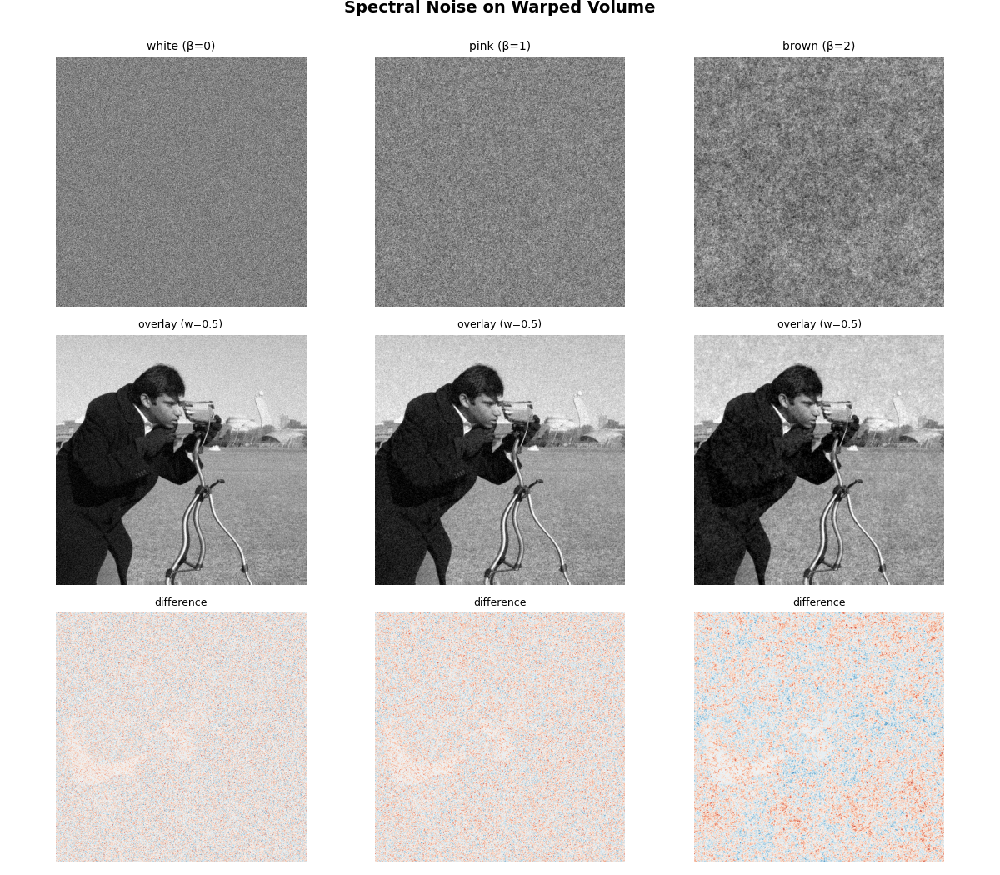

In [14]:
spectral_variants = {
    "white (\u03b2=0)": generate_spectral(shape, spectral_exponent=0.0, rng=np.random.default_rng(SEED)),
    "pink (\u03b2=1)": generate_spectral(shape, spectral_exponent=1.0, rng=np.random.default_rng(SEED)),
    "brown (\u03b2=2)": generate_spectral(shape, spectral_exponent=2.0, rng=np.random.default_rng(SEED)),
}

show_augmented(spectral_variants, warped_volume, DISPLAY_SLICE, weight=0.5, suptitle="Spectral Noise on Warped Volume")

---
## Full Pipeline: Deformation + Combined Noise

Blending multiple noise types onto the warped volume to simulate a realistic augmented DVC specimen.

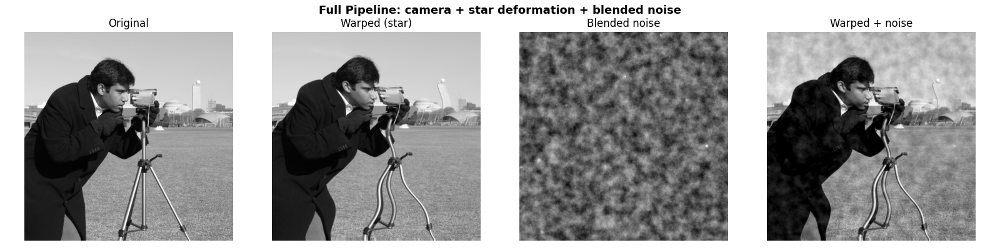

In [15]:
from py_deffields.noise import blend_noise

rng_comb = np.random.default_rng(SEED)
perlin = generate_perlin(shape, scale=24.0, octaves=4, rng=rng_comb)
blobs = generate_blobs(shape, num_blobs=120, radius_mean=4.0, soft=True, rng=rng_comb)
spectral = generate_spectral(shape, spectral_exponent=1.5, rng=rng_comb)

combined_noise = blend_noise(
    normalize_noise(perlin, 0.0, 1.0),
    normalize_noise(blobs, 0.0, 1.0),
    normalize_noise(spectral, 0.0, 1.0),
    weights=[0.5, 0.3, 0.2],
)
combined_disp = (combined_noise[DISPLAY_SLICE] - combined_noise[DISPLAY_SLICE].min())
combined_disp = combined_disp / (combined_disp.max() or 1.0)

weight = 0.4
augmented_slice = np.clip(
    warped_volume[DISPLAY_SLICE] + weight * (combined_disp - 0.5), 0, 1
)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle(
    f"Full Pipeline: {IMAGE_NAME} + {DEFORMATION} deformation + blended noise",
    fontsize=13, fontweight="bold",
)

axes[0].imshow(volume[DISPLAY_SLICE], cmap="gray", vmin=0, vmax=1)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(warped_volume[DISPLAY_SLICE], cmap="gray", vmin=0, vmax=1)
axes[1].set_title(f"Warped ({DEFORMATION})")
axes[1].axis("off")

axes[2].imshow(combined_disp, cmap="gray", vmin=0, vmax=1)
axes[2].set_title("Blended noise")
axes[2].axis("off")

axes[3].imshow(augmented_slice, cmap="gray", vmin=0, vmax=1)
axes[3].set_title("Warped + noise")
axes[3].axis("off")

fig.tight_layout()
plt.show()

### Jacobian Determinant

Check for topology violations (negative Jacobian = folding).

Jacobian range: [-70.5809, 91.0401]
Negative voxels (folds): 1372962 / 16777216 (8.18%)


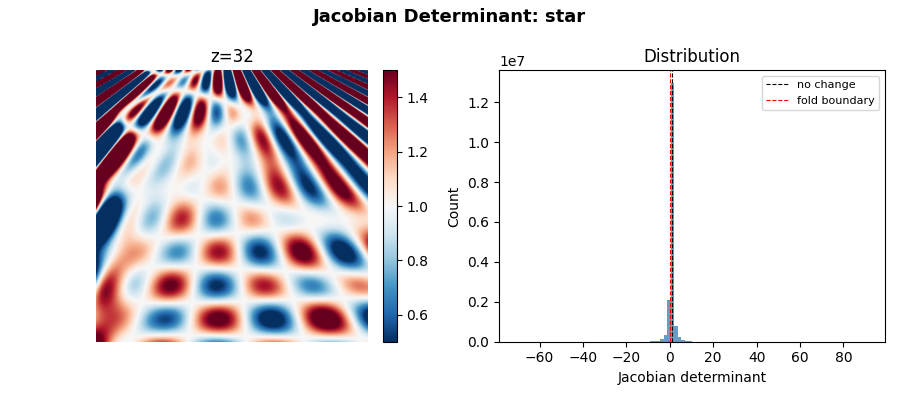

In [16]:
jac_det = pd.jacobian_determinant(displacement)
jac_slice = jac_det[DISPLAY_SLICE]

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
fig.suptitle(f"Jacobian Determinant: {DEFORMATION}", fontsize=13, fontweight="bold")

im0 = axes[0].imshow(jac_slice, cmap="RdBu_r", vmin=0.5, vmax=1.5)
axes[0].set_title(f"z={DISPLAY_SLICE}")
axes[0].axis("off")
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

axes[1].hist(jac_det.ravel(), bins=100, color="steelblue", edgecolor="none", alpha=0.8)
axes[1].axvline(1.0, color="k", linestyle="--", linewidth=0.8, label="no change")
axes[1].axvline(0.0, color="r", linestyle="--", linewidth=0.8, label="fold boundary")
axes[1].set_xlabel("Jacobian determinant")
axes[1].set_ylabel("Count")
axes[1].set_title("Distribution")
axes[1].legend(fontsize=8)

n_negative = np.sum(jac_det < 0)
print(f"Jacobian range: [{jac_det.min():.4f}, {jac_det.max():.4f}]")
print(f"Negative voxels (folds): {n_negative} / {jac_det.size} ({100 * n_negative / jac_det.size:.2f}%)")

fig.tight_layout()
plt.show()